Copyright **`(c)`** 2024 Giovanni Squillero `<giovanni.squillero@polito.it>`  
[`https://github.com/squillero/computational-intelligence`](https://github.com/squillero/computational-intelligence)  
Free under certain conditions — see the [`license`](https://github.com/squillero/computational-intelligence/blob/master/LICENSE.md) for details.  

In [154]:
import logging
from itertools import combinations
import pandas as pd
import numpy as np
from geopy.distance import geodesic
import networkx as nx
import matplotlib.pyplot as plt
import tqdm.auto
from tqdm.auto import tqdm
from icecream import ic
import random
import pandas as pd


logging.basicConfig(level=logging.DEBUG)

In [155]:
# Define the column names
columns = ["Typology_method", "Initial_cost", "Cost_after_mutation", "Initial_solution", "Final_Solution"]

# Create an empty DataFrame with the specified columns
df = pd.DataFrame(columns=columns)


"""
# Append the row to the DataFrame
df.loc[len(df)] = row_data
df.loc[len(df)] = row_data
# Display the DataFrame
print(df)
"""

'\n# Append the row to the DataFrame\ndf.loc[len(df)] = row_data\ndf.loc[len(df)] = row_data\n# Display the DataFrame\nprint(df)\n'

In [156]:
CITIES = pd.read_csv('cities/italy.csv', header=None, names=['name', 'lat', 'lon'])
DIST_MATRIX = np.zeros((len(CITIES), len(CITIES)))
for c1, c2 in combinations(CITIES.itertuples(), 2):
    DIST_MATRIX[c1.Index, c2.Index] = DIST_MATRIX[c2.Index, c1.Index] = geodesic(
        (c1.lat, c1.lon), (c2.lat, c2.lon)
    ).km
CITIES.head()

,name,lat,lon
0,Ancona,43.60,13.50
1,Andria,41.23,16.29
2,Bari,41.12,16.87
3,Bergamo,45.70,9.67
4,Bologna,44.50,11.34


In [157]:
print(len(DIST_MATRIX))
print(type(DIST_MATRIX))
print(DIST_MATRIX[0:2].shape)

46
<class 'numpy.ndarray'>
(2, 46)


## Lab2 - TSP

https://www.wolframcloud.com/obj/giovanni.squillero/Published/Lab2-tsp.nb

In [158]:
def tsp_cost(tsp):
    assert tsp[0] == tsp[-1]                      ### we want the last element equal to the initial 
    assert set(tsp) == set(range(len(CITIES)))    
    tot_cost = 0
    for c1, c2 in zip(tsp, tsp[1:]):
        tot_cost += DIST_MATRIX[c1, c2]
    return tot_cost

nx.find_cycle(G) in the NetworkX library is used to find a cycle in a graph G. A cycle in a graph is a path that starts and ends at the same node, with each edge and node being visited only once (except the start/end node)

In [159]:
def cyclic(edges):
    G = nx.Graph()
    G.add_edges_from(edges)
    try:
        nx.find_cycle(G)
        return True
    except:
        return False

## First Greedy Algorithm

In [160]:
visited = np.full(len(CITIES), False)

dist = DIST_MATRIX.copy()
city = 0
visited[city] = True
tsp = list()
tsp.append(int(city))
while not np.all(visited):
    dist[:, city] = np.inf
    closest = np.argmin(dist[city])    #### here we are finding the closest city 
    logging.debug(
        f"step: {CITIES.at[city,'name']} -> {CITIES.at[closest,'name']} ({DIST_MATRIX[city,closest]:.2f}km)"
    )
    visited[closest] = True
    city = closest
    tsp.append(int(city))


logging.debug(
    f"step: {CITIES.at[tsp[-1],'name']} -> {CITIES.at[tsp[0],'name']} ({DIST_MATRIX[tsp[-1],tsp[0]]:.2f}km)" #### this is the last step to close the cycle
)
tsp.append(tsp[0])


logging.info(f"result: Found a path of {len(tsp)-1} steps, total length {tsp_cost(tsp):.2f}km")


DEBUG:root:step: Ancona -> Rimini (90.60km)
DEBUG:root:step: Rimini -> Forlì (46.72km)
DEBUG:root:step: Forlì -> Ravenna (26.46km)
DEBUG:root:step: Ravenna -> Ferrara (66.67km)
DEBUG:root:step: Ferrara -> Bologna (43.43km)
DEBUG:root:step: Bologna -> Modena (37.29km)
DEBUG:root:step: Modena -> Reggio nell'Emilia (23.94km)
DEBUG:root:step: Reggio nell'Emilia -> Parma (26.94km)
DEBUG:root:step: Parma -> Piacenza (57.65km)
DEBUG:root:step: Piacenza -> Milan (60.65km)
DEBUG:root:step: Milan -> Monza (14.51km)
DEBUG:root:step: Monza -> Bergamo (33.92km)
DEBUG:root:step: Bergamo -> Brescia (46.02km)
DEBUG:root:step: Brescia -> Verona (61.42km)
DEBUG:root:step: Verona -> Vicenza (44.70km)
DEBUG:root:step: Vicenza -> Padua (30.13km)
DEBUG:root:step: Padua -> Venice (36.07km)
DEBUG:root:step: Venice -> Trieste (115.09km)
DEBUG:root:step: Trieste -> Bolzano (209.68km)
DEBUG:root:step: Bolzano -> Trento (49.94km)
DEBUG:root:step: Trento -> Novara (206.69km)
DEBUG:root:step: Novara -> Turin (84.46

## EVOLUTION ALGORITHM

Population: A group of potential solutions to the problem, typically represented as individuals or chromosomes. The population evolves over generations.

Selection: The process of choosing individuals from the population to create offspring. Common methods include:

Tournament Selection: Randomly selecting a subset of individuals and choosing the best among them.
Roulette Wheel Selection: Choosing individuals based on their fitness probability.
Rank-Based Selection: Selecting based on the rank order of fitness values.
Genetic Operators:

Crossover (Recombination): Combines parts of two parent solutions to create offspring. Crossover types include single-point, multi-point, and uniform crossover.
Mutation: Randomly alters an individual’s genes to maintain genetic diversity. Mutation can be bit-flip for binary encoding or Gaussian mutation for real numbers.
Fitness Function: Measures how well each individual solves the problem. Fitness determines an individual's probability of being selected for reproduction.

Replacement Strategy: Determines how to form the next generation, often by combining the parents and offspring and selecting the best individuals, or by replacing only a portion of the population.

Termination Condition: Defines when the algorithm should stop. Common conditions include reaching a maximum number of generations, a solution meeting a desired fitness threshold, or observing no improvement over several generations.

Candidate solution ® Individual -> Set of candidate solutions ® Population ->
-> Ability to solve the problem ® Fitness -> Sequence of steps ® Generations

punti da fare:

    - generare le soluzioni 
    

In [161]:
def GreedyAlgorithm(index_starting):
    global DIST_MATRIX
    visited = np.full(len(CITIES), False)
    dist = DIST_MATRIX.copy()
    city = index_starting
    visited[city] = True
    tsp = list()
    tsp.append(int(city))
    while not np.all(visited):
        dist[:, city] = np.inf
        closest = np.argmin(dist[city])    #### here we are finding the closest city 
        #logging.debug(
        #    f"step: {CITIES.at[city,'name']} -> {CITIES.at[closest,'name']} ({DIST_MATRIX[city,closest]:.2f}km)"
        #)
        visited[closest] = True
        city = closest
        tsp.append(int(city))
    #logging.debug(
    #    f"step: {CITIES.at[tsp[-1],'name']} -> {CITIES.at[tsp[0],'name']} ({DIST_MATRIX[tsp[-1],tsp[0]]:.2f}km)" #### this is the last step to close the cycle
    #)
    tsp.append(tsp[0])
    cost = tsp_cost(tsp)
    #!!!!! remove the sign #
    #logging.info(f"result: Found a path of {len(tsp)-1} steps, total length {cost:.2f}km")
    return (tsp, cost)    

INFO Roulette wheel:Define the Number of Samples Needed: To form a new generation, we often need the same number of individuals as the current population. So, if the population has 𝑁 individuals, we usually draw N samples to maintain a constant population size.

## PARENT SELECTION

In [162]:

def tournament_Selection( tao=5 ):   # we can change dinamically tao
    global population
    tournament_random = random.sample(population, tao)

    tournament_random = sorted( tournament_random , key = lambda x : x[1])

    return tournament_random[0]

def roulette_wheel():
    global population 
    # Problems: • Small selection pressure in large population, in large pop the probabilities are squeeze
    # Not efficient in large population 
    fitness_value = [el[1] for el in population ]
    total= sum(fitness_value)

    probabilities = [fitness / total for fitness in fitness_value]
    selected_individuals = random.choices(population , weights=probabilities, k=len(population))

    return selected_individuals  #### list of selection parent 


def rank_Based_Selection( p_max = 0.4 , p_min = 0.1):
    global population 

    population = sorted( population, key = lambda x : x[1] )

    N = len(population)
    ranked_pop = [  ( index , population[index]  ) for index in range(population)   ]

    # linear
    prob_rank = [     (ranked_pop_element[0] ,  ( p_min + ((p_max - p_min )*( N -ranked_pop_element[0] )/( N -ranked_pop_element[0] ) ) ) )for ranked_pop_element in ranked_pop      ]           

    selected_individuals = random.choices(population , weights=prob_rank[1], k=len(population))

    return selected_individuals

## MUTATION ALGORITHM

- Swap mutation
- Scramble Mutation
- Insert mutation
- Inversion Mutation


In [163]:
def swap_mutation(solution):

    start_point= solution[0]
    combined_solution = solution[1:-1]
    index1, index2 = random.sample(range(len(combined_solution)), 2)
    combined_solution[index1], combined_solution[index2] = combined_solution[index2], combined_solution[index1]
    combined_solution.insert(0, start_point)
    combined_solution.append(start_point)

    return combined_solution

def insert_mutation(solution): 
    start_point= solution[0]
    combined_solution = solution[1:-1]
    index1, index2 = random.sample(range(len(combined_solution)), 2)
    value = combined_solution.pop(index2)
    combined_solution.insert(index1+1, value)
    combined_solution.insert(0, start_point)
    combined_solution.append(start_point)
    #print(combined_solution)

    return combined_solution




## COMBINATION 

In [164]:
#Inver Over

def inver_over_crossover(parent1, parent2):
    start_point_1= parent1[0]
    combined_solution_1 = parent1[:-1]
    #print(parent1)
    #print(parent2)
    #print(combined_solution_1)
    start_point_2= parent2[0]
    combined_solution_2 = parent2[:-1]
    #print(combined_solution_2 , " prendere da qui")
    #print(range(len(combined_solution_1)-1) )
    index1_1= random.sample(range(len(combined_solution_1)-1) , k=1).pop()
    #print(" index value is for the first solution " , index1_1)
    value_1_1 = combined_solution_1[index1_1]         # we get consecutive values
    value_1_2 = combined_solution_1[index1_1+1]       #### from one vector i get 2 valuesù
    #print(index1_1 ,"element ", value_1_1 ,value_1_2)
    value_2_1 = None
    value_2_2 = None
    index2_1 = None
    index2_2 = None
    for el in range(len(combined_solution_2)):
        if((combined_solution_2[el]==value_1_1 or combined_solution_2[el]==value_1_2 ) and ( value_2_1==None and value_2_2==None )):           
            value_2_1 = combined_solution_2[el]
            index2_1 = el
            #print(" index " , index2_1 ," VALUE " ,value_2_1 )
        elif((combined_solution_2[el]==value_1_1 or combined_solution_2[el]==value_1_2 ) and ( value_2_1!=None and value_2_2==None )):           
            value_2_2 = combined_solution_2[el]  
            index2_2 = el
            #print(" index " , index2_2 , " VALUE " ,value_2_2 )
    pieces_Gene = combined_solution_2[index2_1+1: index2_2]
    composition = [] 
    first = combined_solution_2[:index2_1]
    if(len(first)!=0 or first==None):
        composition.extend(first)
    composition.append(value_2_1)
    composition.append(value_2_2)

    #print(composition)
    #print("peices gene value " , pieces_Gene , type(pieces_Gene))
    if(len(pieces_Gene)!=0 ):
        pieces_Gene=pieces_Gene[::-1]
        composition.extend(pieces_Gene)
    #print(composition)
    ####!!!!!! extract better this and ok 
    if index2_2 == len(combined_solution_2) - 1:
        last = []  # Return an empty list if the index corresponds to the last element
    else:
        last = combined_solution_2[index2_2 + 1:]  # Extract values from the last element to the specified
    composition.extend(last)
    last_to_add = composition[0]
    composition.append(last_to_add)
    #composition =composition.append(composition[0]) 
    #print(composition)
    ##delete the last element after the combination add the start element at the end
    return composition

Order Crossover (OX)
• Try to preserve the relative order
• Partially Mapped Crossover (PMX)
• Try to preserve the relative order
• Cycle Crossover (CX)
• Combines cycles of elements from the parents

## TRAIN LOOP

In [165]:
segments = [
    ({c1, c2}, float(DIST_MATRIX[c1, c2])) for c1, c2 in combinations(range(len(CITIES)), 2)
]
visited = set()
edges = set()

shortest = next(_ for _ in sorted(segments, key=lambda e: e[1]))
visited |= shortest[0]
print(visited)
print(shortest)

{21, 14}
({21, 14}, 11.1526869070739)


## Setting the population

roulette_wheel - swap_mutation

In [166]:
# tabella soluzioni - index - object - cost
### generational APPROACH we REPLACE THE PARENTS , WE LOSING THE SOLUTION
population = []
MAX_STEPS = 1_000_000
max_pop= 150

dictionary_best_solution = {}

for index in range(len(DIST_MATRIX)):      #### we start with a population with for each solution 4 copies
    solution = GreedyAlgorithm(index)
    dictionary_best_solution[index] = solution      # k: index  v : ( solution , cost)
    population.append(solution)


population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
before = population[0]
print(population[0][1])
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = roulette_wheel()
    off_spring= sorted(off_spring , key= lambda x : x[1])
    best= off_spring[0]
    #swap
    new_sol = swap_mutation( best[0])
    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population after is ", population[0][1], population[0][0])
    #print(off_string)
row_data = ["roulette_wheel - swap_mutation", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data


best in population is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]
4436.03176952516


100%|██████████| 1000000/1000000 [02:31<00:00, 6596.51it/s]

best in population after is  4431.363767937219 [33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 37, 8, 24, 7, 36, 27, 0, 33]


roulette_wheel - insert_mutation

In [167]:
population = []
MAX_STEPS = 1_000_000
max_pop= 150

dictionary_best_solution = {}

for index in range(len(DIST_MATRIX)):      #### we start with a population with for each solution 4 copies
    solution = GreedyAlgorithm(index)
    dictionary_best_solution[index] = solution      # k: index  v : ( solution , cost)
    population.append(solution)


population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
print(population[0][1])
before= population[0]
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = roulette_wheel()
    off_spring= sorted(off_spring , key= lambda x : x[1])
    best= off_spring[0]
    #swap
    new_sol = insert_mutation( best[0])
    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population is ", population[0][1], population[0][0])
row_data = ["roulette_wheel - insert_mutation", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data
    #print(off_string)

best in population is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]
4436.03176952516


100%|██████████| 1000000/1000000 [02:34<00:00, 6458.50it/s]

best in population is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]


tournament_Selection - swap_mutation

In [168]:
# tabella soluzioni - index - object - cost
### generational APPROACH we REPLACE THE PARENTS , WE LOSING THE SOLUTION
population = []
MAX_STEPS = 1_000_000
max_pop= 150

dictionary_best_solution = {}

for index in range(len(DIST_MATRIX)):      #### we start with a population with for each solution 4 copies
    solution = GreedyAlgorithm(index)
    dictionary_best_solution[index] = solution      # k: index  v : ( solution , cost)
    population.append(solution)


population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
print(population[0][1])
before = population[0]
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = tournament_Selection()
    #off_spring= sorted(off_spring , key= lambda x : x[1])
    #best= off_spring[0]
    best= off_spring

    #swap
    new_sol = swap_mutation( best[0])
    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population after is ", population[0][1], population[0][0])

row_data = ["tourment_selection - swap_mutation", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data

best in population is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]
4436.03176952516


100%|██████████| 1000000/1000000 [00:35<00:00, 28272.94it/s]

best in population after is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]


tournament_Selection - Insert_mutation

In [169]:
# tabella soluzioni - index - object - cost
### generational APPROACH we REPLACE THE PARENTS , WE LOSING THE SOLUTION
population = []
MAX_STEPS = 1_000_000
max_pop= 150

dictionary_best_solution = {}

for index in range(len(DIST_MATRIX)):      #### we start with a population with for each solution 4 copies
    solution = GreedyAlgorithm(index)
    dictionary_best_solution[index] = solution      # k: index  v : ( solution , cost)
    population.append(solution)


population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
print(population[0][1])
before = population[0]
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = tournament_Selection()
    #off_spring= sorted(off_spring , key= lambda x : x[1])
    best=off_spring
    #swap
    new_sol = insert_mutation( best[0])
    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population after is ", population[0][1], population[0][0])
row_data = ["tourment selection - insert_mutation", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data

best in population is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]
4436.03176952516


100%|██████████| 1000000/1000000 [00:36<00:00, 27087.86it/s]

best in population after is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]


HYPER - MODER ALGORITHM

Tourment Selection  - swap_mutation - insert mutation - inner over mutation

In [170]:
# tabella soluzioni - index - object - cost
### generational APPROACH we REPLACE THE PARENTS , WE LOSING THE SOLUTION
population = []
MAX_STEPS = 5_000_000
max_pop= 150

dictionary_best_solution = {}

for index in range(len(DIST_MATRIX)):      #### we start with a population with for each solution 4 copies
    solution = GreedyAlgorithm(index)
    dictionary_best_solution[index] = solution      # k: index  v : ( solution , cost)
    population.append(solution)


population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
print(population[0][1])
before = population[0]
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = tournament_Selection()
    best= off_spring
    best2 = tournament_Selection()

    #swap
    random_number = random.random()

    # we pick randomly mutation or combination
    if random_number > 0.8:
        random_number1 = random.random()
        if(random_number1>0.5):
            new_sol =swap_mutation( best[0])
        else:
            new_sol = insert_mutation( best[0])
    else:
        new_sol = inver_over_crossover( best[0],best2[0])

    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population after is ", population[0][1], population[0][0])
row_data = ["Tourment Selection - swap_mutation - insert_mutation - inner_over", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data

best in population is  4436.03176952516 [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 26, 39, 34, 15, 14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 7, 36, 27, 0]
4436.03176952516


100%|██████████| 5000000/5000000 [04:07<00:00, 20175.87it/s]

best in population after is  4436.031769525159 [0, 27, 36, 7, 24, 37, 8, 31, 17, 38, 2, 1, 11, 35, 21, 14, 15, 34, 39, 26, 10, 29, 16, 13, 42, 22, 40, 5, 41, 43, 23, 45, 44, 6, 3, 20, 18, 28, 25, 32, 19, 4, 9, 30, 12, 33, 0]


- create solution using the greedy algorithm but using a different starting point

## Second Greedy Algorithm -NOT YET IMPLEMENTED BY THE PROFESSOR

NOT YET IMPLEMENTED BY THE PROFESSOR

In [171]:
segments = [
    ({c1, c2}, float(DIST_MATRIX[c1, c2])) for c1, c2 in combinations(range(len(CITIES)), 2)
]
visited = set()
edges = set()

shortest = next(_ for _ in sorted(segments, key=lambda e: e[1]))
visited |= shortest[0]
print(visited)
print(shortest)

edges |= {tuple(shortest[0])}
segments = [s for s in segments if not cyclic(edges | {tuple(s[0])})]

print(edges)
print(segments)

print(cyclic(edges))

print(shortest)

{21, 14}
({21, 14}, 11.1526869070739)
{(21, 14)}
[({0, 1}, 349.30401144305745), ({0, 2}, 391.0418681947875), ({0, 3}, 383.0204391314121), ({0, 4}, 199.89962990855176), ({0, 5}, 364.0447808729763), ({0, 6}, 338.8096401206489), ({0, 7}, 609.696280667211), ({0, 8}, 690.431902252931), ({0, 9}, 204.4253666122213), ({0, 10}, 183.29551097355267), ({0, 11}, 290.4028573916701), ({0, 12}, 136.70372473443274), ({0, 13}, 377.57973448944483), ({0, 14}, 301.99049212290043), ({0, 15}, 241.85490798374872), ({0, 16}, 258.5284939080245), ({0, 17}, 625.0755286998198), ({0, 18}, 401.9399754108604), ({0, 19}, 237.16017652663953), ({0, 20}, 401.4539129529872), ({0, 21}, 312.00387878900796), ({0, 22}, 438.9328915074273), ({0, 23}, 239.268808375456), ({0, 24}, 608.6754823442737), ({0, 25}, 287.5153079129395), ({0, 26}, 105.17159317964676), ({0, 27}, 139.23847120123253), ({0, 28}, 345.1318096169963), ({0, 29}, 196.77126979341847), ({0, 30}, 137.84822902835992), ({0, 31}, 635.9878049331178), ({0, 32}, 260.60105

## ALGORITHM TO FIND SOLUTION


working but worst then the greedy maybe depending from the starting
greedy algorithm uses different starting point

new algorithm modification of the greedy but withsome modification to avoid ping_pong effect
new starting point

In [172]:
visited = np.full(len(CITIES), False)
dist = segments.copy()
#print(dist)
iterator = iter(sorted(shortest[0]))
city = next(iterator)
#print(city)
next_city = next(iterator)
#print(next_city)
visited[city] = True
tsp = list()
tsp.append(int(city))

previous_point= shortest
#print("first point " , previous_point)
i=0
logging.debug(
        f"step: {CITIES.at[city,'name']} -> {CITIES.at[next_city,'name']} ({DIST_MATRIX[city,next_city]:.2f}km)"
    )
#for i in range(4):
while not np.all(visited):
    #print()
    #print(i) 
    #print(previous_point)

    dist = [ distance for distance in dist if not all(previous_point[0] in distance for item in dist) ] ### remove previous point 
    
    pick_next_city = []
    for edge in dist:
        tuple_set= edge[0]
        if(next_city in tuple_set ):              ###### we save the tuple in which there are the next city x -> y
            pick_next_city.append(edge)           ###### filtering only the points with the next city 

    pick_next_city=sorted(pick_next_city, key=lambda x: x[1])
    #print(pick_next_city)
    if(len(pick_next_city)==0):
        visited[next_city] = True
        tsp.append(int(next_city))
        #print(visited)
        break
    
    boolean_flag=False
    for element in pick_next_city:
        #print()
        tupla = element[0]
        distance= element[1]    
        #print("element printed " , element)
        filtered_values = {value for value in tupla if value != next_city}.pop()  ### we are extracting the value from the set that are not included
                                                                                  ###    (y , z) we extract z 
        extract = [ distance for distance in dist if all( {filtered_values, city} in distance for item in dist  )  ].pop() # distance STARTING POINT - NEW POINT WITHOUT MIDDLE
                                                                                                                            ### we save the tuple (x, z)
        #print(filtered_values , "   " , city)
        #print("extracted mean (x, z)" , extract)
        #print("comparison between " , previous_point, extract)

        if(extract[1]>previous_point[1]):             #### comparison of distance of  ( x, z ) > (x , y )
            boolean_flag=True
            dist = [ distance for distance in dist if city not in distance[0]   ]      #clean the distance- we are removing all starting point

            #print("the length of dist is ",len(dist))
            previous_point= element
            #print(previous_point)
            #print("the new point is " ,previous_point)
            city= next_city
            #print("the city is ", city)

            next_city =  filtered_values
            #print("the next is",next_city)
            break
        if(boolean_flag==False):
            print("ERROR LOOP IN")
            #print(city , next_city)
    #i+=1
    visited[next_city] = True
    tsp.append(int(city))
    logging.debug(
        f"step: {CITIES.at[city,'name']} -> {CITIES.at[next_city,'name']} ({DIST_MATRIX[city,next_city]:.2f}km)"
    )

logging.debug(
    f"step: {CITIES.at[tsp[-1],'name']} -> {CITIES.at[tsp[0],'name']} ({DIST_MATRIX[tsp[-1],tsp[0]]:.2f}km)" #### this is the last step to close the cycle
    )
tsp.append(tsp[0])


logging.info(f"result: Found a path of {len(tsp)-1} steps, total length {tsp_cost(tsp):.2f}km")

DEBUG:root:step: Giugliano in Campania -> Naples (11.15km)
DEBUG:root:step: Naples -> Salerno (46.25km)
DEBUG:root:step: Salerno -> Foggia (109.52km)
DEBUG:root:step: Foggia -> Andria (67.42km)
DEBUG:root:step: Andria -> Bari (50.18km)
DEBUG:root:step: Bari -> Taranto (77.63km)
DEBUG:root:step: Taranto -> Messina (293.02km)
DEBUG:root:step: Messina -> Reggio di Calabria (12.48km)
DEBUG:root:step: Reggio di Calabria -> Catania (84.28km)
DEBUG:root:step: Catania -> Syracuse (51.23km)
DEBUG:root:step: Syracuse -> Palermo (206.47km)
DEBUG:root:step: Palermo -> Latina (374.12km)
DEBUG:root:step: Latina -> Rome (56.84km)
DEBUG:root:step: Rome -> Terni (76.54km)
DEBUG:root:step: Terni -> Perugia (63.64km)
DEBUG:root:step: Perugia -> Ancona (105.17km)
DEBUG:root:step: Ancona -> Rimini (90.60km)
DEBUG:root:step: Rimini -> Forlì (46.72km)
DEBUG:root:step: Forlì -> Ravenna (26.46km)
DEBUG:root:step: Ravenna -> Ferrara (66.67km)
DEBUG:root:step: Ferrara -> Bologna (43.43km)
DEBUG:root:step: Bologn

Tourment Selection - swap_mutation - insert_mutation - inner_over - Solution close to Greedy algorithm

In [173]:
population = []
MAX_STEPS = 5_000_000
max_pop= 150

population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))



population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
print(population[0][1])
before = population[0]
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = tournament_Selection()
    best= off_spring
    best2 = tournament_Selection()

    #swap
    random_number = random.random()

    # we pick randomly mutation or combination
    if random_number > 0.8:
        random_number1 = random.random()
        if(random_number1>0.5):
            new_sol =swap_mutation( best[0])
        else:
            new_sol = insert_mutation( best[0])
    else:
        new_sol = inver_over_crossover( best[0],best2[0])

    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population after is ", population[0][1], population[0][0])
row_data = ["Tourment Selection - swap_mutation - insert_mutation - inner_over", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data

best in population is  4898.633717459978 [14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 15, 34, 39, 26, 0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 27, 36, 7, 14]
4898.633717459978


100%|██████████| 5000000/5000000 [04:01<00:00, 20733.89it/s]

best in population after is  4898.633717459978 [14, 21, 35, 11, 1, 2, 38, 17, 31, 8, 37, 24, 15, 34, 39, 26, 0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, 3, 6, 44, 45, 23, 43, 41, 5, 40, 22, 42, 13, 16, 29, 10, 27, 36, 7, 14]


## ALGORITHM with WORST SOLUTION

From the solution - apply a Local Search 

In [174]:
visited = np.full(len(CITIES), False)
G = nx.Graph()
dist = segments.copy()
city = next(iter(sorted(shortest[0])))
visited[city] = True
tsp = list()
tsp.append(int(city))


while not np.all(visited):
#for i in range(1):
    ### here we decide how to pick the next 
    picking_next = [  tup  for tup in dist if city in tup[0]  ]
    #print( picking_next )
    ### computing some statistical measure
    distances = [tup[1]  for tup in dist  ]
    mean = np.mean(distances)
    variance = np.var(distances, ddof=0) 

    rank_obj = []
    for index_value in  picking_next:
        tuple_index = index_value[0]
        distance= index_value[1]
        if( distance > mean):
            rank_obj.append(index_value)
    
    if(len(rank_obj)!=0):
        rank_obj=sorted(rank_obj, key=lambda x: x[1])
        next_city = rank_obj[0]
    else:
        if(len(picking_next)!=1):
            for index_value in  picking_next:
                tuple_index = index_value[0]
                distance= index_value[1]
                print(distance , mean)
                if( distance < mean):
                    rank_obj.append(index_value)
            rank_obj = sorted(rank_obj, key=lambda x: x[1])
            if(len(rank_obj)!=1):
                next_city = rank_obj[0]
        else:
            next_city = picking_next[0]

    for indexis in next_city[0]:
        if(indexis!=city):
            feet= indexis
    dist = [  tup  for tup in dist if city not in tup[0]       ] 
    #closest = np.argmin(dist[city])    #### here we are finding the closest city 


    G.add_nodes_from([city, feet])
    G.add_edge(city, feet, weight=round(next_city[1], 2) )



    logging.debug(
        f"step: {CITIES.at[city,'name']} -> {CITIES.at[feet,'name']} ({DIST_MATRIX[city,feet]:.2f}km)"
    )
    visited[feet] = True
    city = feet
    tsp.append(int(city))


logging.debug(
    f"step: {CITIES.at[tsp[-1],'name']} -> {CITIES.at[tsp[0],'name']} ({DIST_MATRIX[tsp[-1],tsp[0]]:.2f}km)" #### this is the last step to close the cycle
)
tsp.append(tsp[0])


logging.info(f"result: Found a path of {len(tsp)-1} steps, total length {tsp_cost(tsp):.2f}km")    # assertion error

DEBUG:root:step: Giugliano in Campania -> Leghorn (433.25km)
DEBUG:root:step: Leghorn -> Naples (444.26km)
DEBUG:root:step: Naples -> Prato (427.29km)
DEBUG:root:step: Prato -> Foggia (453.65km)
DEBUG:root:step: Foggia -> Florence (436.78km)
DEBUG:root:step: Florence -> Salerno (451.00km)
DEBUG:root:step: Salerno -> Forlì (453.18km)
DEBUG:root:step: Forlì -> Sassari (481.26km)
DEBUG:root:step: Sassari -> Reggio nell'Emilia (473.48km)
DEBUG:root:step: Reggio nell'Emilia -> Andria (601.96km)
DEBUG:root:step: Andria -> Syracuse (469.85km)
DEBUG:root:step: Syracuse -> Bari (469.91km)
DEBUG:root:step: Bari -> Catania (430.50km)
DEBUG:root:step: Catania -> Latina (479.30km)
DEBUG:root:step: Latina -> Taranto (382.23km)
DEBUG:root:step: Taranto -> Palermo (424.97km)
DEBUG:root:step: Palermo -> Cagliari (390.28km)
DEBUG:root:step: Cagliari -> Rome (413.25km)
DEBUG:root:step: Rome -> Modena (332.36km)
DEBUG:root:step: Modena -> Pescara (360.33km)
DEBUG:root:step: Pescara -> Bologna (324.43km)
D

Tourment Selection - swap_mutation - insert_mutation - inner_over _ worst_solution

In [175]:
# tabella soluzioni - index - object - cost
### generational APPROACH we REPLACE THE PARENTS , WE LOSING THE SOLUTION
population = []
MAX_STEPS = 5_000_000
max_pop= 150

population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))
population.append((tsp, tsp_cost(tsp)))


population = sorted(population ,  key= lambda x : x[1])
print("best in population is ", population[0][1], population[0][0])
print(population[0][1])
before = population[0]
for steps in tqdm(range(MAX_STEPS)):
    # best roulette
    off_spring = tournament_Selection()
    best= off_spring
    best2 = tournament_Selection()

    #swap
    random_number = random.random()

    # we pick randomly mutation or combination
    if random_number > 0.8:
        random_number1 = random.random()
        if(random_number1>0.5):
            new_sol =swap_mutation( best[0])
        else:
            new_sol = insert_mutation( best[0])
    else:
        new_sol = inver_over_crossover( best[0],best2[0])

    new_starting_point = new_sol[0]
    new_sol_cost = tsp_cost(new_sol)

    best_from_dict = dictionary_best_solution[new_starting_point]   ### we don't lose the best solution
    if(best_from_dict[1]>new_sol_cost  ):
        sol_tupla = (new_sol, new_sol_cost)
        dictionary_best_solution[new_starting_point] = sol_tupla #### we replace only the best in the pop replaced
                                                                       #### go in elitism
    if(len(population )< max_pop):
        population.append( (new_sol, new_sol_cost) )
    elif(new_sol_cost < best[1]):
        for pop in population:
            if(pop[0]==best[0] and pop[1]== best[1]):
                pop=new_sol
    population = sorted(population ,  key= lambda x : x[1])

print("best in population after is ", population[0][1], population[0][0])
row_data = ["Tourment Selection - swap_mutation - insert_mutation - inner_over", before[1], population[0][1], before[0], population[0][0]]  # Added a separate list for "Final_Solution"
df.loc[len(df)] = row_data

best in population is  17985.34451350532 [14, 16, 21, 29, 11, 10, 35, 12, 36, 32, 1, 37, 2, 8, 15, 38, 24, 7, 34, 19, 27, 4, 17, 39, 25, 41, 6, 26, 45, 42, 40, 0, 44, 31, 33, 28, 23, 3, 9, 20, 43, 18, 30, 13, 5, 22, 14]
17985.34451350532


100%|██████████| 5000000/5000000 [04:08<00:00, 20143.48it/s]

best in population after is  15277.778942639303 [14, 16, 42, 29, 11, 10, 35, 12, 36, 24, 1, 37, 31, 8, 15, 39, 32, 7, 34, 19, 27, 21, 17, 38, 25, 41, 6, 26, 4, 45, 40, 0, 44, 2, 33, 28, 23, 3, 9, 20, 43, 18, 30, 13, 5, 22, 14]


## Result

In [176]:
print(df)


                                     Typology_method  Initial_cost  \
0                     roulette_wheel - swap_mutation   4436.031770   
1                   roulette_wheel - insert_mutation   4436.031770   
2                 tourment_selection - swap_mutation   4436.031770   
3               tourment selection - insert_mutation   4436.031770   
4  Tourment Selection - swap_mutation - insert_mu...   4436.031770   
5  Tourment Selection - swap_mutation - insert_mu...   4898.633717   
6  Tourment Selection - swap_mutation - insert_mu...  17985.344514   

   Cost_after_mutation                                   Initial_solution  \
0          4431.363768  [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, ...   
1          4436.031770  [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, ...   
2          4436.031770  [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, ...   
3          4436.031770  [0, 33, 12, 30, 9, 4, 19, 32, 25, 28, 18, 20, ...   
4          4436.031770  [0, 33, 12, 30, 9, 4, 19, 32, 

## General Graph - Representation

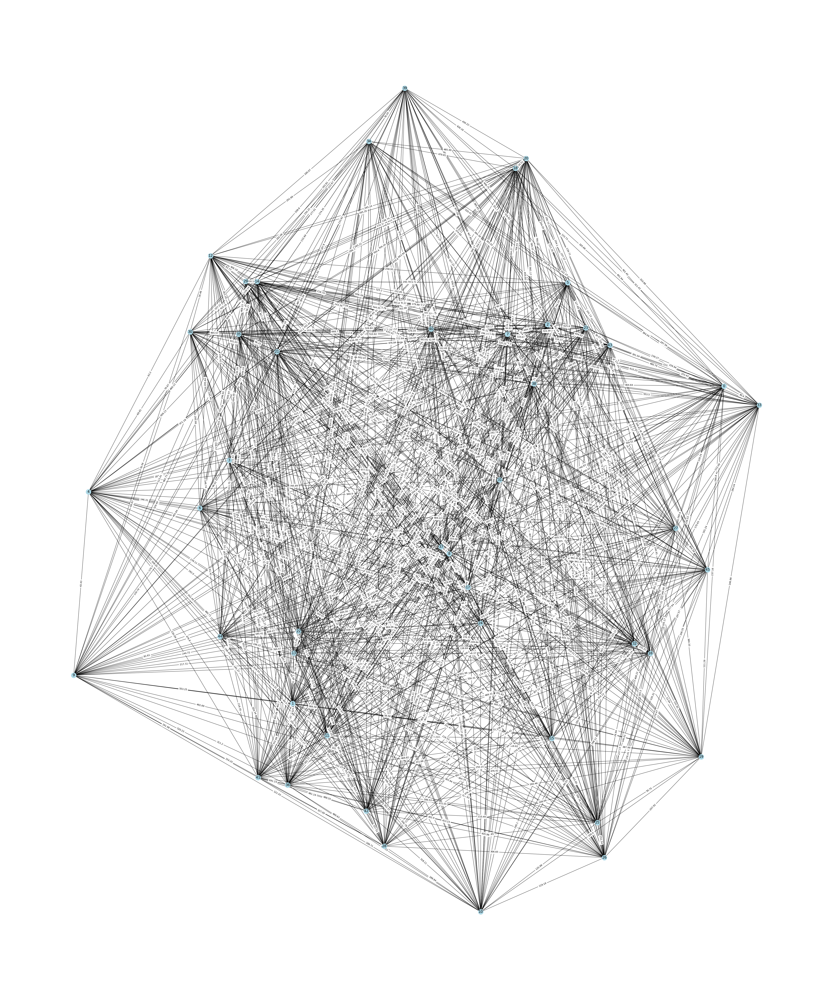

In [177]:
# Create an undirected graph
G = nx.Graph()

for element in segments:
    #print()
    #print(element)
    # Add nodes
    iterator = iter(element[0])
    A=next(iterator)
    B=next(iterator)    
    G.add_nodes_from([A, B])
    # Add an undirected edge with a weight

    G.add_edge(A, B, weight=round(element[1], 2) )

# Check the edge with weight
#print("Edges with weights:", G.edges(data=True))
# Define the position of nodes for a simple layout
pos = nx.spring_layout(G)


# Increase figure size
plt.figure(figsize=(50, 60))  # Width=10, Height=6
# Draw the nodes and edges
nx.draw(G, pos, with_labels=True, node_color="lightblue", node_size=500, font_size=15)

# Draw edge labels (weights)
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

# Display the graph
plt.show()